In [19]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

print("Libraries imported successfully!")

Libraries imported successfully!


In [20]:
DATASET_DIR = Path("data")

PCB_USED_DIR = DATASET_DIR / "raw" / "PCB_USED"
IMAGES_DIR = DATASET_DIR / "raw" / "images"
ANNOTATIONS_DIR = DATASET_DIR / "raw" / "Annotations"

print("PCB_USED folder:", PCB_USED_DIR)
print("Images folder:", IMAGES_DIR)
print("Annotations folder:", ANNOTATIONS_DIR)

PCB_USED folder: data\raw\PCB_USED
Images folder: data\raw\images
Annotations folder: data\raw\Annotations


In [21]:
# ==========================================
# Dataset Paths
# ==========================================

PROJECT_ROOT = Path.cwd().parent.parent

DATASET_DIR = PROJECT_ROOT / "data"

PCB_USED_DIR = DATASET_DIR / "raw" / "PCB_USED"

IMAGES_DIR = DATASET_DIR / "raw" / "Images"

ANNOTATIONS_DIR = DATASET_DIR / "raw" / "Annotations"


print("Project Root:")
print(PROJECT_ROOT)

print("\nPCB_USED:")
print(PCB_USED_DIR)

print("\nImages:")
print(IMAGES_DIR)

print("\nAnnotations:")
print(ANNOTATIONS_DIR)

Project Root:
c:\Users\szepi\Downloads\PCB-Defect-Inspection\PCB-Defect-Inspection

PCB_USED:
c:\Users\szepi\Downloads\PCB-Defect-Inspection\PCB-Defect-Inspection\data\raw\PCB_USED

Images:
c:\Users\szepi\Downloads\PCB-Defect-Inspection\PCB-Defect-Inspection\data\raw\Images

Annotations:
c:\Users\szepi\Downloads\PCB-Defect-Inspection\PCB-Defect-Inspection\data\raw\Annotations


In [22]:
# ==========================================
# Check PCB_USED
# ==========================================

for file in PCB_USED_DIR.iterdir():

    if file.suffix.lower() == ".jpg":
        print(file.name)

    elif file.suffix.lower() == ".jpeg":
        print(file.name)

    elif file.suffix.lower() == ".png":
        print(file.name)

01.JPG
04.JPG
05.JPG
06.JPG
07.JPG
08.JPG
09.JPG
10.JPG
11.JPG
12.JPG


In [23]:
# ==========================================
# Load Normal + Defective PCB
# ==========================================

normal_path = PCB_USED_DIR / "01.JPG"

defective_path = (
    IMAGES_DIR
    / "Missing_hole"
    / "01_missing_hole_01.jpg"
)

normal = cv2.imread(
    str(normal_path)
)

defective = cv2.imread(
    str(defective_path)
)

if normal is None:
    raise FileNotFoundError(
        f"Normal image not found:\n{normal_path}"
    )

if defective is None:
    raise FileNotFoundError(
        f"Defective image not found:\n{defective_path}"
    )

print("Normal image loaded:")
print(normal_path)

print("\nDefective image loaded:")
print(defective_path)

print("\nNormal size:", normal.shape)
print("Defective size:", defective.shape)

Normal image loaded:
c:\Users\szepi\Downloads\PCB-Defect-Inspection\PCB-Defect-Inspection\data\raw\PCB_USED\01.JPG

Defective image loaded:
c:\Users\szepi\Downloads\PCB-Defect-Inspection\PCB-Defect-Inspection\data\raw\Images\Missing_hole\01_missing_hole_01.jpg

Normal size: (1586, 3034, 3)
Defective size: (1586, 3034, 3)


In [24]:
# ==========================================
# Enhancement Stages
# CLAHE → Gamma → Laplacian Sharpening
# ==========================================

def enhance_pcb_stages(image):

    # ======================================
    # 1. Grayscale
    # ======================================

    gray = cv2.cvtColor(
        image,
        cv2.COLOR_BGR2GRAY
    )


    # ======================================
    # 2. CLAHE
    # ======================================

    clahe = cv2.createCLAHE(
        clipLimit=2.0,
        tileGridSize=(8, 8)
    )

    clahe_image = clahe.apply(
        gray
    )


    # ======================================
    # 3. Gamma Correction
    # ======================================

    gamma = 1.2

    gamma_table = np.array(
        [
            ((i / 255.0) ** (1.0 / gamma)) * 255
            for i in range(256)
        ]
    ).astype(np.uint8)

    gamma_image = cv2.LUT(
        clahe_image,
        gamma_table
    )


    # ======================================
    # 4. Laplacian Sharpening
    # ======================================

    laplacian = cv2.Laplacian(
        gamma_image,
        cv2.CV_64F
    )

    laplacian_abs = cv2.convertScaleAbs(
        laplacian
    )

    sharpened = cv2.addWeighted(
        gamma_image,
        1.0,
        laplacian_abs,
        -0.7,
        0
    )


    return (
        gray,
        clahe_image,
        gamma_image,
        sharpened
    )

In [25]:
# ==========================================
# Apply Each Enhancement Stage
# ==========================================

(
    normal_gray,
    normal_clahe,
    normal_gamma,
    normal_sharpened
) = enhance_pcb_stages(normal)


(
    defective_gray,
    defective_clahe,
    defective_gamma,
    defective_sharpened
) = enhance_pcb_stages(defective)

In [26]:
# ==========================================
# Prepare Original Images for Display
# ==========================================

normal_rgb = cv2.cvtColor(
    normal,
    cv2.COLOR_BGR2RGB
)

defective_rgb = cv2.cvtColor(
    defective,
    cv2.COLOR_BGR2RGB
)

print("RGB display images prepared.")

RGB display images prepared.


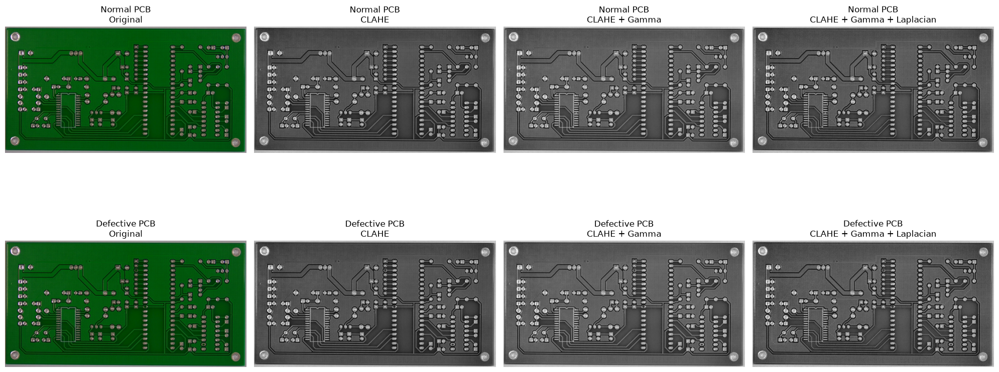

In [27]:
# ==========================================
# Display Enhancement Stages
# ==========================================

plt.figure(
    figsize=(20, 10)
)


# ======================================
# NORMAL PCB
# ======================================

plt.subplot(2, 4, 1)

plt.imshow(
    normal_rgb
)

plt.title(
    "Normal PCB\nOriginal"
)

plt.axis("off")


plt.subplot(2, 4, 2)

plt.imshow(
    normal_clahe,
    cmap="gray"
)

plt.title(
    "Normal PCB\nCLAHE"
)

plt.axis("off")


plt.subplot(2, 4, 3)

plt.imshow(
    normal_gamma,
    cmap="gray"
)

plt.title(
    "Normal PCB\nCLAHE + Gamma"
)

plt.axis("off")


plt.subplot(2, 4, 4)

plt.imshow(
    normal_sharpened,
    cmap="gray"
)

plt.title(
    "Normal PCB\nCLAHE + Gamma + Laplacian"
)

plt.axis("off")


# ======================================
# DEFECTIVE PCB
# ======================================

plt.subplot(2, 4, 5)

plt.imshow(
    defective_rgb
)

plt.title(
    "Defective PCB\nOriginal"
)

plt.axis("off")


plt.subplot(2, 4, 6)

plt.imshow(
    defective_clahe,
    cmap="gray"
)

plt.title(
    "Defective PCB\nCLAHE"
)

plt.axis("off")


plt.subplot(2, 4, 7)

plt.imshow(
    defective_gamma,
    cmap="gray"
)

plt.title(
    "Defective PCB\nCLAHE + Gamma"
)

plt.axis("off")


plt.subplot(2, 4, 8)

plt.imshow(
    defective_sharpened,
    cmap="gray"
)

plt.title(
    "Defective PCB\nCLAHE + Gamma + Laplacian"
)

plt.axis("off")


plt.tight_layout()

plt.show()

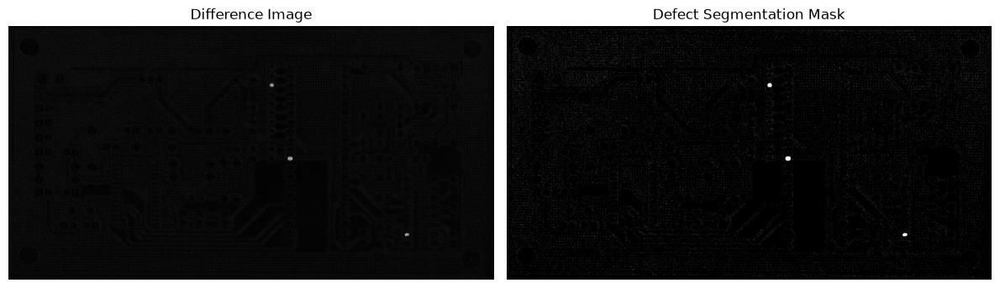

In [28]:
# ==========================================
# Defect Segmentation
# ==========================================

# Use the final enhanced images
# CLAHE + Gamma + Laplacian Sharpening

normal_enhanced = normal_sharpened

defective_enhanced = defective_sharpened


# ==========================================
# Calculate Difference
# ==========================================

difference = cv2.absdiff(
    normal_enhanced,
    defective_enhanced
)


# ==========================================
# Threshold the Difference
# ==========================================

_, defect_mask = cv2.threshold(
    difference,
    30,
    255,
    cv2.THRESH_BINARY
)


# ==========================================
# Display Results
# ==========================================

plt.figure(
    figsize=(12, 5)
)


# Difference Image
plt.subplot(
    1,
    2,
    1
)

plt.imshow(
    difference,
    cmap="gray"
)

plt.title(
    "Difference Image"
)

plt.axis("off")


# Defect Segmentation Mask
plt.subplot(
    1,
    2,
    2
)

plt.imshow(
    defect_mask,
    cmap="gray"
)

plt.title(
    "Defect Segmentation Mask"
)

plt.axis("off")


plt.tight_layout()

plt.show()

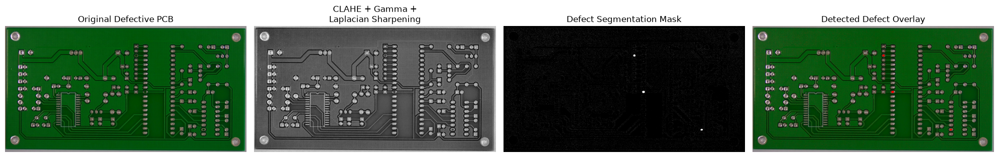

In [29]:
# ==========================================
# Visualize Enhancement + Segmentation
# ==========================================

overlay = defective_rgb.copy()

# Mark detected segmentation pixels in red
overlay[defect_mask > 0] = [255, 0, 0]


plt.figure(
    figsize=(20, 5)
)


# ==========================================
# 1. Original Defective PCB
# ==========================================

plt.subplot(1, 4, 1)

plt.imshow(
    defective_rgb
)

plt.title(
    "Original Defective PCB"
)

plt.axis("off")


# ==========================================
# 2. Enhanced Defective PCB
# ==========================================

plt.subplot(1, 4, 2)

plt.imshow(
    defective_sharpened,
    cmap="gray"
)

plt.title(
    "CLAHE + Gamma +\n"
    "Laplacian Sharpening"
)

plt.axis("off")


# ==========================================
# 3. Segmentation Mask
# ==========================================

plt.subplot(1, 4, 3)

plt.imshow(
    defect_mask,
    cmap="gray"
)

plt.title(
    "Defect Segmentation Mask"
)

plt.axis("off")


# 4. Overlay

plt.subplot(1, 4, 4)

plt.imshow(
    overlay
)

plt.title(
    "Detected Defect Overlay"
)

plt.axis("off")


plt.tight_layout()

plt.show()

In [30]:
# Check Six Defect Folders

defect_classes = [
    "Missing_hole",
    "Mouse_bite",
    "Open_circuit",
    "Short",
    "Spur",
    "Spurious_copper"
]

print("Defect folders:")
print("================")

for defect_class in defect_classes:

    defect_folder = IMAGES_DIR / defect_class

    if defect_folder.exists():

        image_count = 0

        for file in defect_folder.iterdir():

            if file.suffix.lower() == ".jpg":
                image_count += 1

            elif file.suffix.lower() == ".jpeg":
                image_count += 1

            elif file.suffix.lower() == ".png":
                image_count += 1

        print(
            defect_class,
            ":",
            image_count,
            "images"
        )

    else:

        print(
            defect_class,
            ": FOLDER NOT FOUND"
        )

Defect folders:
Missing_hole : 115 images
Mouse_bite : 115 images
Open_circuit : 116 images
Short : 116 images
Spur : 115 images
Spurious_copper : 116 images


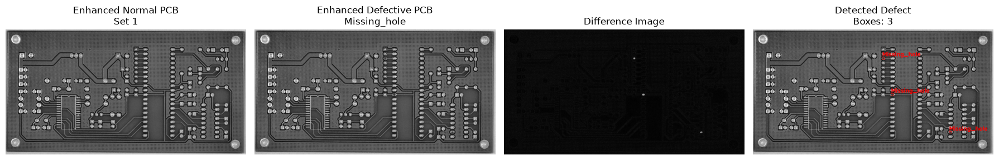

SEGMENTATION TEST
Parameter Set: Set 2
Defect Class: Missing_hole
PCB ID: 01
Defective Image: 01_missing_hole_01.jpg
Normal Image: 01.JPG
Threshold: 30
Minimum Area: 20
Detected Bounding Boxes: 3


In [33]:
# ==========================================
# Cell 11: Segmentation Test
# Set 2
# ==========================================

import cv2
import numpy as np
import matplotlib.pyplot as plt


# ==========================================
# 1. Select Test Image
# ==========================================

TEST_DEFECT_CLASS = "Missing_hole"
TEST_PCB_ID = "01"


# ==========================================
# 2. Define Set 2 Directories
# ==========================================

SET1_DIR = (
    PROJECT_ROOT
    / "data"
    / "clean"
    / "dataset_limszeping_set1"
)

SET1_IMAGES_DIR = (
    SET1_DIR
    / "images"
    / "train"
)

SET1_NORMAL_DIR = (
    SET1_DIR
    / "normal"
    / "train"
)


# ==========================================
# 3. Find Defective Image
# ==========================================

defective_files = sorted(
    [
        file
        for file in SET1_IMAGES_DIR.iterdir()
        if file.is_file()
        and file.suffix.lower()
        in [".jpg", ".jpeg", ".png"]
        and file.stem.startswith(
            TEST_PCB_ID + "_"
        )
        and TEST_DEFECT_CLASS.lower()
        in file.stem.lower()
    ]
)


if len(defective_files) == 0:

    raise FileNotFoundError(
        "No defective image found."
    )


defective_path = defective_files[0]


# ==========================================
# 4. Find Matching Normal PCB
# ==========================================

normal_files = sorted(
    [
        file
        for file in SET1_NORMAL_DIR.iterdir()
        if file.is_file()
        and file.suffix.lower()
        in [".jpg", ".jpeg", ".png"]
        and file.stem == TEST_PCB_ID
    ]
)


if len(normal_files) == 0:

    raise FileNotFoundError(
        f"No normal PCB found for PCB {TEST_PCB_ID}"
    )


normal_path = normal_files[0]


# ==========================================
# 5. Load Enhanced Images
# ==========================================

normal_enhanced = cv2.imread(
    str(normal_path),
    cv2.IMREAD_GRAYSCALE
)

defective_enhanced = cv2.imread(
    str(defective_path),
    cv2.IMREAD_GRAYSCALE
)


if normal_enhanced is None:

    raise ValueError(
        "Cannot load normal enhanced image."
    )


if defective_enhanced is None:

    raise ValueError(
        "Cannot load defective enhanced image."
    )


# ==========================================
# 6. Resize Defective Image
# ==========================================

defective_enhanced = cv2.resize(
    defective_enhanced,
    (
        normal_enhanced.shape[1],
        normal_enhanced.shape[0]
    )
)


# ==========================================
# 7. Difference Image
# ==========================================

difference = cv2.absdiff(
    normal_enhanced,
    defective_enhanced
)


# ==========================================
# 8. Threshold
# ==========================================

THRESHOLD_VALUE = 30

_, defect_mask = cv2.threshold(
    difference,
    THRESHOLD_VALUE,
    255,
    cv2.THRESH_BINARY
)


# ==========================================
# 9. Remove Small Noise
# ==========================================

kernel = np.ones(
    (3, 3),
    np.uint8
)


# ==========================================
# 10. Find Defect Contours
# ==========================================

contours, _ = cv2.findContours(
    defect_mask,
    cv2.RETR_EXTERNAL,
    cv2.CHAIN_APPROX_SIMPLE
)


# ==========================================
# 11. Create Bounding Box Overlay
# ==========================================

overlay = cv2.cvtColor(
    defective_enhanced,
    cv2.COLOR_GRAY2RGB
)


MIN_AREA = 20

detected_boxes = []


for contour in contours:

    area = cv2.contourArea(
        contour
    )

    if area < MIN_AREA:
        continue

    x, y, w, h = cv2.boundingRect(
        contour
    )

    detected_boxes.append(
        (x, y, w, h)
    )

    cv2.rectangle(
        overlay,
        (x, y),
        (x + w, y + h),
        (255, 0, 0),
        3
    )

    cv2.putText(
        overlay,
        TEST_DEFECT_CLASS,
        (x, max(y - 10, 20)),
        cv2.FONT_HERSHEY_SIMPLEX,
        2.6,
        (255, 0, 0),
        3
    )


# ==========================================
# 12. Display Results
# ==========================================

plt.figure(
    figsize=(18, 5)
)


# Enhanced Normal
plt.subplot(1, 4, 1)

plt.imshow(
    normal_enhanced,
    cmap="gray"
)

plt.title(
    "Enhanced Normal PCB\nSet 1"
)

plt.axis("off")


# Enhanced Defective
plt.subplot(1, 4, 2)

plt.imshow(
    defective_enhanced,
    cmap="gray"
)

plt.title(
    f"Enhanced Defective PCB\n"
    f"{TEST_DEFECT_CLASS}"
)

plt.axis("off")


# Difference
plt.subplot(1, 4, 3)

plt.imshow(
    difference,
    cmap="gray"
)

plt.title(
    "Difference Image"
)

plt.axis("off")


# Bounding Box
plt.subplot(1, 4, 4)

plt.imshow(
    overlay
)

plt.title(
    f"Detected Defect\n"
    f"Boxes: {len(detected_boxes)}"
)

plt.axis("off")


plt.tight_layout()

plt.show()


# ==========================================
# 13. Information
# ==========================================

print("==========================================")
print("SEGMENTATION TEST")
print("==========================================")

print(
    "Parameter Set: Set 2"
)

print(
    "Defect Class:",
    TEST_DEFECT_CLASS
)

print(
    "PCB ID:",
    TEST_PCB_ID
)

print(
    "Defective Image:",
    defective_path.name
)

print(
    "Normal Image:",
    normal_path.name
)

print(
    "Threshold:",
    THRESHOLD_VALUE
)

print(
    "Minimum Area:",
    MIN_AREA
)

print(
    "Detected Bounding Boxes:",
    len(detected_boxes)
)

print("==========================================")

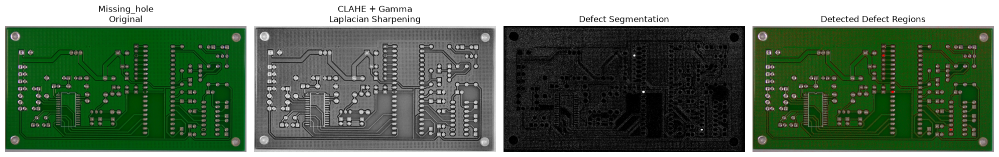

Defect: Missing_hole
PCB Reference: 01
Defective Image: 01_missing_hole_01.jpg
------------------------------------------


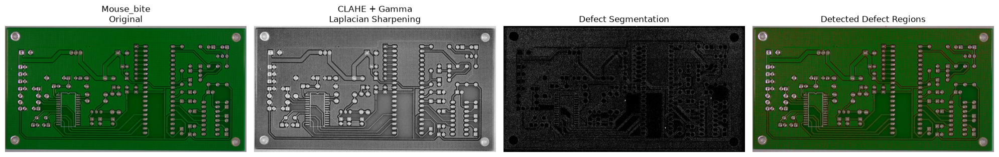

Defect: Mouse_bite
PCB Reference: 01
Defective Image: 01_mouse_bite_01.jpg
------------------------------------------


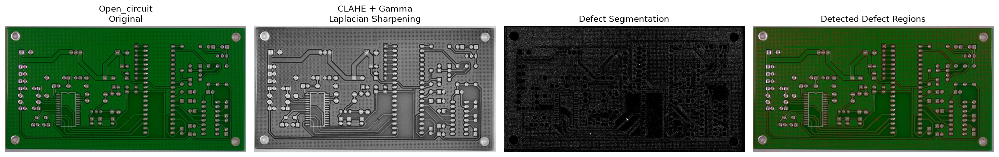

Defect: Open_circuit
PCB Reference: 01
Defective Image: 01_open_circuit_01.jpg
------------------------------------------


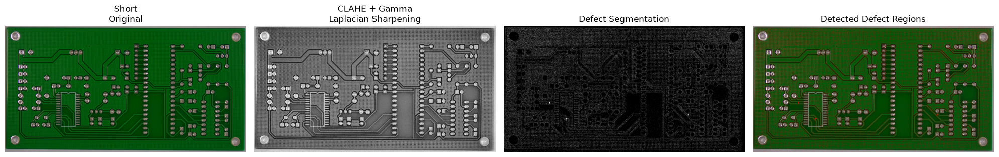

Defect: Short
PCB Reference: 01
Defective Image: 01_short_01.jpg
------------------------------------------


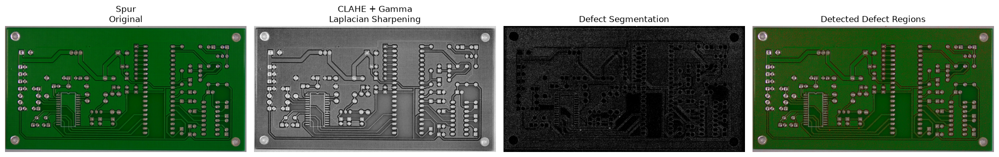

Defect: Spur
PCB Reference: 01
Defective Image: 01_spur_01.jpg
------------------------------------------


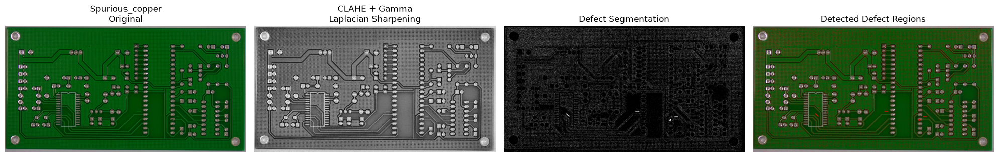

Defect: Spurious_copper
PCB Reference: 01
Defective Image: 01_spurious_copper_01.jpg
------------------------------------------


In [49]:
# ==========================================
# Cell 9: Full Pipeline Test - 6 Defect Types
#
# CLAHE
#   ↓
# Gamma Correction
#   ↓
# Laplacian Sharpening
#   ↓
# Difference Segmentation
#   ↓
# Defect Overlay
# ==========================================

defect_classes = [
    "Missing_hole",
    "Mouse_bite",
    "Open_circuit",
    "Short",
    "Spur",
    "Spurious_copper"
]


# ==========================================
# Function: Get image files
# ==========================================

def get_image_files(folder):

    image_files = []

    for file in folder.iterdir():

        if file.suffix.lower() == ".jpg":
            image_files.append(file)

        elif file.suffix.lower() == ".jpeg":
            image_files.append(file)

        elif file.suffix.lower() == ".png":
            image_files.append(file)

    return sorted(image_files)


# ==========================================
# Function: Find matching normal PCB
# ==========================================

def find_normal_pcb(pcb_number):

    for file in PCB_USED_DIR.iterdir():

        if file.suffix.lower() == ".jpg":
            if file.stem == pcb_number:
                return file

        elif file.suffix.lower() == ".jpeg":
            if file.stem == pcb_number:
                return file

        elif file.suffix.lower() == ".png":
            if file.stem == pcb_number:
                return file

    return None


# ==========================================
# Process all 6 defect types
# ==========================================

for defect_class in defect_classes:

    defect_folder = IMAGES_DIR / defect_class

    image_files = get_image_files(
        defect_folder
    )

    if len(image_files) == 0:

        print(
            "No image found:",
            defect_class
        )

        continue


    # --------------------------------------
    # Select one sample
    # --------------------------------------

    defective_path = image_files[0]

    # Example:
    # 01_missing_hole_01.jpg
    #
    # Extract PCB number:
    # 01

    pcb_number = defective_path.stem[:2]

    normal_path = find_normal_pcb(
        pcb_number
    )


    if normal_path is None:

        print(
            "Normal PCB not found for:",
            defective_path.name
        )

        continue


    # ======================================
    # Load images
    # ======================================

    normal = cv2.imread(
        str(normal_path)
    )

    defective = cv2.imread(
        str(defective_path)
    )


    if normal is None:

        print(
            "Cannot load normal:",
            normal_path
        )

        continue


    if defective is None:

        print(
            "Cannot load defective:",
            defective_path
        )

        continue


    # ======================================
    # Resize defective to normal size
    # ======================================

    defective = cv2.resize(
        defective,
        (
            normal.shape[1],
            normal.shape[0]
        )
    )


# ======================================
# 1. CLAHE + Gamma + Laplacian
# ======================================

    normal_enhanced = enhance_pcb(
    normal,
    3.0,
    1.5,
    -1.0
)
    defective_enhanced = enhance_pcb(
     defective,
        3.0,
            1.5,
    -1.0
    )


    # ======================================
    # 2. Difference
    # ======================================

    difference = cv2.absdiff(
        normal_enhanced,
        defective_enhanced
    )


    # ======================================
    # 3. Segmentation
    # ======================================

    _, defect_mask = cv2.threshold(
        difference,
        30,
        255,
        cv2.THRESH_BINARY
    )


    # ======================================
    # 4. Create overlay
    # ======================================

    defective_rgb = cv2.cvtColor(
        defective,
        cv2.COLOR_BGR2RGB
    )

    overlay = defective_rgb.copy()

    overlay[
        defect_mask > 0
    ] = [255, 0, 0]


    # ======================================
    # 5. Display full pipeline
    # ======================================

    plt.figure(
        figsize=(20, 5)
    )


    # --------------------------------------
    # Original
    # --------------------------------------

    plt.subplot(1, 4, 1)

    plt.imshow(
        defective_rgb
    )

    plt.title(
        defect_class
        + "\nOriginal"
    )

    plt.axis("off")


    # --------------------------------------
    # Enhanced
    # --------------------------------------

    plt.subplot(1, 4, 2)

    plt.imshow(
        defective_enhanced,
        cmap="gray"
    )

    plt.title(
        "CLAHE + Gamma\n"
        "Laplacian Sharpening"
    )

    plt.axis("off")


    # --------------------------------------
    # Segmentation
    # --------------------------------------

    plt.subplot(1, 4, 3)

    plt.imshow(
        defect_mask,
        cmap="gray"
    )

    plt.title(
        "Defect Segmentation"
    )

    plt.axis("off")


    # --------------------------------------
    # Overlay
    # --------------------------------------

    plt.subplot(1, 4, 4)

    plt.imshow(
        overlay
    )

    plt.title(
        "Detected Defect Regions"
    )

    plt.axis("off")


    plt.tight_layout()

    plt.show()


    print(
        "Defect:",
        defect_class
    )

    print(
        "PCB Reference:",
        pcb_number
    )

    print(
        "Defective Image:",
        defective_path.name
    )

    print("------------------------------------------")
